In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Data

In [66]:
df = pd.read_csv('merged_collisions_weather_2012-2024.csv')

In [67]:
len(df)

1922359

In [68]:
df.columns

Index(['Unnamed: 0', 'CRASH DATE', 'CRASH TIME', 'BOROUGH', 'LATITUDE',
       'LONGITUDE', 'LOCATION', 'NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED', 'NUMBER OF PEDESTRIANS INJURED',
       'NUMBER OF PEDESTRIANS KILLED', 'NUMBER OF CYCLIST INJURED',
       'NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST INJURED',
       'NUMBER OF MOTORIST KILLED', 'CONTRIBUTING FACTOR VEHICLE 1',
       'CONTRIBUTING_FACTOR_GROUP', 'temperature_2m (°C)',
       'precipitation (mm)', 'rain (mm)', 'cloudcover (%)',
       'cloudcover_low (%)', 'cloudcover_mid (%)', 'cloudcover_high (%)',
       'windspeed_10m (km/h)', 'winddirection_10m (°)'],
      dtype='object')

In [69]:
df['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()

CONTRIBUTING FACTOR VEHICLE 1
Unspecified                       645348
Driver Inattention/Distraction    396200
Failure to Yield Right-of-Way     118616
Following Too Closely             100028
Backing Unsafely                   72907
                                   ...  
Cell Phone (hand-held)                66
80                                    62
Texting                               51
Listening/Using Headphones            24
1                                      5
Name: count, Length: 61, dtype: int64

In [70]:
# Convert into datetime format
df['CRASH DATE'] = pd.to_datetime(df['CRASH DATE'])
df['CRASH TIME'] = pd.to_datetime(df['CRASH TIME'])

# Convert BOROUGH values from uppercase to title case
df['BOROUGH'] = df['BOROUGH'].str.title()

# Erase 2025
df = df[df['CRASH DATE'].dt.year != 2025]

C:\Users\alvar\AppData\Local\Temp\ipykernel_22692\1465486155.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



# **ACCIDENTS**

## **Accidents per year (2012-2024)**

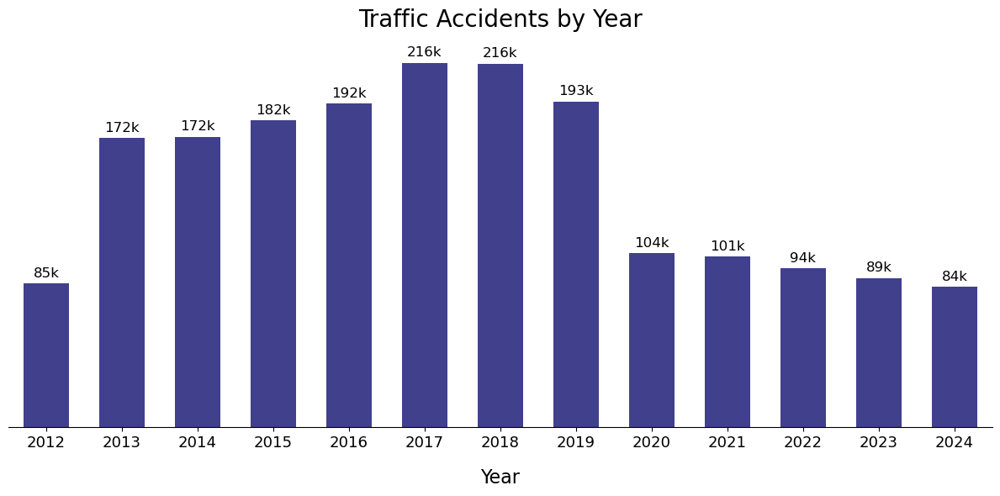

In [71]:
df_new = df.copy()

df_new['Year'] = df_new['CRASH DATE'].dt.year
borough_year = df_new.groupby('Year').size()
borough_year

# Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=borough_year.index,
    y=borough_year.values,
    color='navy',
    alpha=.8,
    width=0.6,              
)

# axis labels / title
plt.title('Traffic Accidents by Year', fontsize=20, fontweight='normal',pad=15)
plt.xlabel('Year', fontsize=16, labelpad=15)
plt.ylabel('')

# ticks & grid
plt.xticks(rotation=0,  fontsize=13)
plt.yticks([])
plt.grid(axis='y', linestyle='--', alpha=0.0)
sns.despine(left=True, bottom=False)

# add values above bars
for p in ax.patches:
    height = p.get_height()
    label  = f'{height/1_000:.0f}k' 
    ax.text(
        p.get_x() + p.get_width() / 2,     
        height + 0.01 * borough_year.max(),
        label,
        ha='center', va='bottom',
        fontsize=12,
        color='black'
    )

plt.tight_layout()
plt.show()

## **Deaths per year (2012-2024)**

In [72]:
# Create a new dataframe with deaths per year by type
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, FactorRange, Legend, LegendItem, ColorBar, LinearColorMapper
from bokeh.layouts import column, row
from bokeh.palettes import Category10, Blues9
from bokeh.io import output_notebook
from bokeh.transform import linear_cmap
from bokeh.models import FixedTicker

# We want the figure to show in the notebook
output_notebook()

# Prepare the data
df_deaths = df.copy()
df_deaths['Year'] = df_deaths['CRASH DATE'].dt.year

# Group by year and sum the deaths by type
deaths_by_year = df_deaths.groupby('Year').agg({
    'NUMBER OF PERSONS KILLED': 'sum',
    'NUMBER OF PEDESTRIANS KILLED': 'sum',
    'NUMBER OF CYCLIST KILLED': 'sum',
    'NUMBER OF MOTORIST KILLED': 'sum'
}).reset_index()

# Convert years to strings for categorical x-axis
deaths_by_year['Year'] = deaths_by_year['Year'].astype(str)

# Define death types and colors
death_types = [
    'NUMBER OF PERSONS KILLED',
    'NUMBER OF PEDESTRIANS KILLED', 
    'NUMBER OF CYCLIST KILLED', 
    'NUMBER OF MOTORIST KILLED'
]

# Create a ColumnDataSource
source = ColumnDataSource(deaths_by_year)

# Create figure with categorical x-range
p = figure(
    x_range=deaths_by_year['Year'].tolist(),
    height=500, 
    width=800,
    title="Fatalities per Year (2012-2024)",
    toolbar_location="above",
    tools="pan,wheel_zoom,box_zoom,reset,save",
    min_border=0,  # Remove margins
    margin=0  # Remove margins
)

p.title.text_font = "Arial"  # Set font family
p.title.text_font_size = '15pt'  # Set font size
p.title.text_font_style = 'normal'

# Set global text properties for the figure
p.axis.axis_label_text_font = "Arial"
p.axis.major_label_text_font = "Arial"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"
p.xaxis.major_label_text_font_size = "12pt"

# List to store legend items
legend_items = []

# Find the maximum death count across all types for consistent scaling
max_deaths = deaths_by_year[death_types].max().max()

# Create a color mapper for each death type with the same scale
mappers = {}
for death_type in death_types:
    mappers[death_type] = linear_cmap(
        field_name=death_type, 
        palette=list(reversed(Blues9)), 
        low=-50,
        high=max_deaths  # Use the same maximum for all types
    )

# Plot bars with different colors
for i, death_type in enumerate(death_types):
    # Create a more readable label
    label = death_type.replace('NUMBER OF ', '').replace(' KILLED', '')
    
    # Plot the bar with color mapping for all types
    bar = p.vbar(
        x='Year', 
        top=death_type, 
        source=source, 
        width=0.8, 
        color=mappers[death_type],
        muted_alpha=0.0,
        muted=(i!=0)
    )
    
    # Add to legend items
    legend_items.append(LegendItem(label=label, renderers=[bar]))

# Set axis labels with improved formatting
p.xaxis.axis_label = "Year"
# Remove the y-axis label
p.y_range.start = 0

# Improve axis appearance
p.xaxis.major_label_orientation = 0
# p.xaxis.major_label_text_font_size = "12pt"

# Hide the y-axis completely
p.yaxis.visible = False  # This hides the entire y-axis including ticks and labels

# Remove the y-grid lines
p.ygrid.grid_line_alpha = 0

# Create a separate legend
legend = Legend(items=legend_items, location="center", click_policy="mute")

# Add legend to the plot on the LEFT side
p.add_layout(legend, 'left')

# Add a single color bar for all death types
color_bar = ColorBar(
    color_mapper=LinearColorMapper(
        palette=list(reversed(Blues9)),
        low=0,
        high=max_deaths
    ),
    location=(0, 0),
    title="Number of Deaths",
    title_standoff=12,
    width=8,
    height=400,
    border_line_color=None,
    orientation='vertical',
    ticker=FixedTicker(ticks=[0, 50, 100, 150, 200, 250, 300]),  # Specify exact tick positions
    major_label_text_font_size="10pt"
)

# Add the color bar to the figure on the RIGHT side
p.add_layout(color_bar, 'right')

# Customize the plot appearance
# p.title.text_font_size = "16pt"
# p.xaxis.axis_label_text_font_size = "14pt"
p.xgrid.grid_line_color = None

# Remove all padding and margins
# p.min_border_left = 0
# p.min_border_right = 0
# p.min_border_top = 0
# p.min_border_bottom = 0
p.outline_line_color = None

# Show the plot
show(p)

Loading BokehJS ...

## **Accidents per Borough (Interactive)**

In [73]:
from urllib.request import urlopen
import json
import os
with urlopen('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Borough_Boundary/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson') as response:
    districts = json.load(response)
import plotly.express as px

UNCOMMENT LINES BELOW TO SAVE HTML

In [74]:
# Aggregate the data by the district
df_new = df.copy()
a = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
a = a['BOROUGH'].value_counts()

# Proper form to plug into choropleth function
df_choroplex = a.reset_index()
df_choroplex.columns = ['BOROUGH', 'Count']

# Make sure the assets directory exists
# Put here the route!!!!!!!
# assets_dir = r"c:\Users\alvar\Desktop\02806_SDAV\Part2_SocialVisualization\aql14.github.io\assets\images"
# if not os.path.exists(assets_dir):
#     os.makedirs(assets_dir)

# Create the choropleth map
fig = px.choropleth(df_choroplex, 
                    geojson=districts, 
                    color="Count",
                    locations="BOROUGH", 
                    featureidkey="properties.BoroName",
                    range_color=(0, 120000),
                    projection="mercator",
                    color_continuous_scale="Blues",
                    labels={"Count": "Accidents"}
                   )

# Make the map bigger and clearer
fig.update_geos(fitbounds="locations", visible=False)

# Define a consistent font style
font_family = "Arial, sans-serif"
title_font_size = 20
label_font_size = 16
tick_font_size = 14

# Improve layout with larger text and figure size
fig.update_layout(
    # Increase figure size
    width=1000,
    height=800,
    
    # Add title with larger font
    title={
        'text': "Number of Traffic Accidents by NY Borough (2017-2018)",
        # 'font': {'size': 20, 'family': 'Arial, sans-serif', 'color': '#333333'},
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    
    # Improve margins
    margin={"r":20, "t":80, "l":20, "b":20},
    
    # Enhance colorbar appearance
    coloraxis_colorbar={
        'title': {'text': '', 'font': {'size': 18}},
        'tickfont': {'size': 16},
        'thickness': 20,
        'len': 0.6
    },
    
    # Improve overall font size
    font={'size': 16, 'family': 'Arial, sans-serif'}
)

fig.show()

# Save the html
# html_file_path = os.path.join(assets_dir, "ny_accidents_map.html")
# # Create the HTML with custom CSS to remove scrollbars
# with open(html_file_path, 'w') as f:
#     html_content = fig.to_html(
#         include_plotlyjs=True, 
#         full_html=True,
#         config={
#             'scrollZoom': False,     # Disable scroll wheel zooming
#             'doubleClick': False,    # Disable double-click zooming
#             'displayModeBar': False, # Hide the mode bar which contains zoom controls
#             'showAxisDragHandles': False,  # Disable axis drag to zoom
#             'showTips': False        # Disable hover tips about the mode bar
#         }
#     )
    
#     # Add custom CSS to remove scrollbars
#     html_content = html_content.replace('</head>', '''
#     <style>
#         body {
#             overflow: hidden;
#             margin: 0;
#             padding: 0;
#         }
#         .plotly-graph-div {
#             overflow: hidden !important;
#         }
#         ::-webkit-scrollbar {
#             display: none;
#         }
#     </style>
#     </head>
#     ''')
    
#     f.write(html_content)

# print(f"Interactive map saved to {html_file_path}")

## **Deaths per Borough (Interactive)**

In [75]:
# Aggregate the data by the district
df_new = df.copy()
a = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
# a = a['BOROUGH'].value_counts()

a = a.groupby(['BOROUGH'])['NUMBER OF PERSONS KILLED'].sum()
# Proper form to plug into choropleth function
df_choroplex = a.reset_index()
df_choroplex.columns = ['BOROUGH', 'Count']

# Create the choropleth map
fig = px.choropleth(df_choroplex, 
                    geojson=districts, 
                    color="Count",
                    locations="BOROUGH", 
                    featureidkey="properties.BoroName",
                    range_color=(0, 140),
                    projection="mercator",
                    color_continuous_scale="Oranges",
                    labels={"Count": "Accidents"}
                   )

# Make the map bigger and clearer
fig.update_geos(fitbounds="locations", visible=False)

# Define a consistent font style
font_family = "Arial, sans-serif"
title_font_size = 20
label_font_size = 16
tick_font_size = 14

# Improve layout with larger text and figure size
fig.update_layout(
    # Increase figure size
    width=1000,
    height=800,
    
    # Add title with larger font
    title={
        'text': "Traffic Fatalities by NY Borough (2017-2018)",
        # 'font': {'size': 20, 'family': 'Arial, sans-serif', 'color': '#333333'},
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    
    # Improve margins
    margin={"r":20, "t":80, "l":20, "b":20},
    
    # Enhance colorbar appearance
    coloraxis_colorbar={
        'title': {'text': '', 'font': {'size': 18}},
        'tickfont': {'size': 16},
        'thickness': 20,
        'len': 0.6
    },
    
    # Improve overall font size
    font={'size': 16, 'family': 'Arial, sans-serif'}
)

fig.show()

# Save the html
# html_file_path = os.path.join(assets_dir, "ny_fatalities_map.html")
# # Create the HTML with custom CSS to remove scrollbars
# with open(html_file_path, 'w') as f:
#     html_content = fig.to_html(
#         include_plotlyjs=True, 
#         full_html=True,
#         config={
#             'scrollZoom': False,     # Disable scroll wheel zooming
#             'doubleClick': False,    # Disable double-click zooming
#             'displayModeBar': False, # Hide the mode bar which contains zoom controls
#             'showAxisDragHandles': False,  # Disable axis drag to zoom
#             'showTips': False        # Disable hover tips about the mode bar
#         }
#     )
    
#     # Add custom CSS to remove scrollbars
#     html_content = html_content.replace('</head>', '''
#     <style>
#         body {
#             overflow: hidden;
#             margin: 0;
#             padding: 0;
#         }
#         .plotly-graph-div {
#             overflow: hidden !important;
#         }
#         ::-webkit-scrollbar {
#             display: none;
#         }
#     </style>
#     </head>
#     ''')
    
#     f.write(html_content)

# print(f"Interactive map saved to {html_file_path}")

## **Accidents per Hour (Interactive)**

In [76]:
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, Select, CustomJS
from bokeh.layouts import column
from bokeh.transform import cumsum

In [77]:
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
df_new['Hour'] = df_new['CRASH TIME'].dt.hour
# Group by District and Hour
hourly_counts = df_new.groupby(['BOROUGH', 'Hour']).size().reset_index(name='Count')

In [78]:
# Create a dictionary of data per district
districts = hourly_counts['BOROUGH'].unique()
district_data = {}
for district in districts:
    df_dist = hourly_counts[hourly_counts['BOROUGH'] == district]
    counts = np.zeros(24)
    counts[df_dist['Hour']] = df_dist['Count'].values
    angles = np.linspace(0, 2 * np.pi, 24, endpoint=False)
    district_data[district] = pd.DataFrame({
        'hour': list(range(24)),
        'angle': angles,
        'count': counts,
        'angle_degrees': np.degrees(angles),
        'color': ['#718dbf'] * 24
    })

In [ ]:
from bokeh.plotting import figure, show, output_file
from bokeh.models import ColumnDataSource, Legend, LegendItem, ColorBar, LinearColorMapper
from bokeh.layouts import column, row
from bokeh.palettes import Category10, Blues9
from bokeh.transform import transform
from bokeh.io import output_notebook, curdoc

# Get unique districts
districts = sorted(df_new['BOROUGH'].unique())

# Create a color palette for districts
colors = Category10[len(districts)] if len(districts) <= 10 else Category10[10]

# Create the figure
p = figure(
    width=800, height=600,
    title="Accidents by Hour of Day (2017)",
    toolbar_location=None, tools="",
    x_axis_type=None, y_axis_type=None,
    min_border=0, outline_line_color=None,
    background_fill_color="#ffffff"
)

p.title.text_font = "Arial"  # Set font family
p.title.text_font_size = '15pt'  # Set font size
p.title.text_font_style = 'normal'

# Set global text properties for the figure
p.axis.axis_label_text_font = "Arial"
p.axis.major_label_text_font = "Arial"
p.xaxis.axis_label_text_font_size = "12pt"
p.yaxis.axis_label_text_font_size = "12pt"

# Find the maximum count across all districts for consistent scaling
max_count = 0
for district in districts:
    district_data = df_new[df_new['BOROUGH'] == district]
    if not district_data.empty:
        district_max = district_data['Hour'].value_counts().max()
        if district_max > max_count:
            max_count = district_max

# Create color mapper for consistent coloring
color_mapper = LinearColorMapper(palette=list(reversed(Blues9)), low=0, high=max_count)

# List to store legend items
legend_items = []

# Plot each district as a separate wedge series
for i, district in enumerate(districts):
    district_data = df_new[df_new['BOROUGH'] == district]
    
    # Count crimes by hour
    hourly_counts = district_data['Hour'].value_counts().sort_index()
    
    # Create a complete range of hours (0-23)
    full_hours = pd.Series(0, index=range(24))
    hourly_counts = hourly_counts.add(full_hours, fill_value=0)
    
    # Convert to radians for polar coordinates
    theta = [(hour + 0.5) * 2 * np.pi / 24 for hour in hourly_counts.index]
    width = 2*np.pi/24 * 0.9  # Bar width with spacing
    
    # Calculate start and end angles explicitly
    start_angles = [t - width/2 for t in theta]
    end_angles = [t + width/2 for t in theta]
    
    # Create data source
    source = ColumnDataSource(data=dict(
        hour=hourly_counts.index,
        count=hourly_counts.values,
        theta=theta,
        start_angle=start_angles,
        end_angle=end_angles
    ))
    
    # Add the wedges (bars) for this district
    wedges = p.wedge(
        x=0, y=0, radius="count",
        start_angle="start_angle",
        end_angle="end_angle",
        source=source,
        fill_color=transform('count', color_mapper),
        line_color=None,
        alpha=1,
        muted_alpha=0.0,  # When muted, make it invisible
        # muted=True       # Start not muted
        muted=(i != 3),    # Only the first district is not muted initially
    )
    
    # Add to legend
    legend_items.append(LegendItem(label=district, renderers=[wedges]))

# Add hour labels at cardinal points
for hour, angle in [(0, 0), (6, np.pi/2), (12, np.pi), (18, 3*np.pi/2)]:
    label_angle = angle
    x = 1.1 * max_count * np.sin(label_angle)
    y = 1.1 * max_count * np.cos(label_angle)
    p.text(x, y, text=[f"{hour:02d}"], text_align="center", text_baseline="middle", text_font_size="14pt")

# # Add radial lines for each hour
# for hour in range(24):
#     angle = hour * 2 * np.pi / 24
#     x0, y0 = 0, 0
#     x1 = max_count * 1.05 * np.sin(angle)
#     y1 = max_count * 1.05 * np.cos(angle)
#     p.line([x0, x1], [y0, y1], color="gray", alpha=0.3, line_width=0.5)

# Add color bar
color_bar = ColorBar(
    color_mapper=color_mapper,
    title="Number of Accidents",
    location=(0, 0),
    orientation="vertical",
    title_standoff=12
)
p.add_layout(color_bar, 'right')

# Create a legend with click policy
legend = Legend(
    items=legend_items,
    location="center",
    click_policy="mute",  # This enables the interactive toggling
    label_text_font="Arial",
    label_text_font_size="10pt"
)

# Add the legend to the left of the plot
p.add_layout(legend, 'left')

# For Jupyter notebook
output_notebook()
show(p)

# # For standalone HTML (TO SAVE THE HTML)!!!!!!
# output_file("c:/Users/alvar/Desktop/02806_SDAV/Part2_SocialVisualization/aql14.github.io/assets/images/accidents_by_hour.html", title="Accidents by Hour of Day (2017)")
# save(p)

Loading BokehJS ...

# **WEATHER**

## **Avearge Temperature**

MONTH

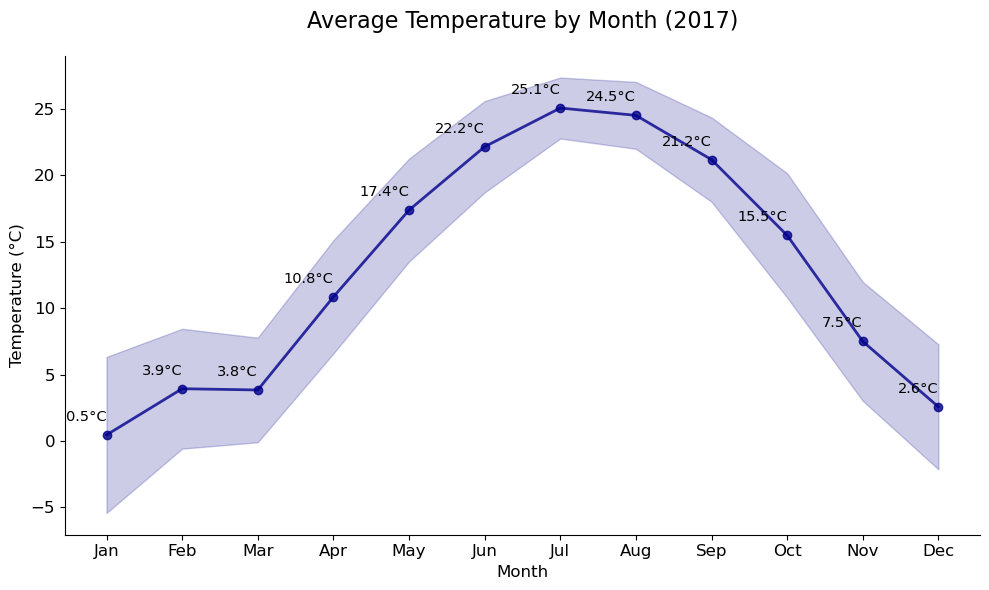

In [80]:
# Create a copy of the dataframe for temperature analysis
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
df_temp = df_new.copy()

# Extract month from CRASH DATE
df_temp['Month'] = df_temp['CRASH DATE'].dt.month

# Group by month and calculate average temperature and std
monthly_stats = df_temp.groupby('Month')['temperature_2m (°C)'].agg(['mean', 'std']).reset_index()

# Create a more readable month name column
import calendar
monthly_stats['Month_Name'] = monthly_stats['Month'].apply(lambda x: calendar.month_abbr[x])

# Sort by month number to ensure chronological order
monthly_stats = monthly_stats.sort_values('Month')

plt.figure(figsize=(10, 6))

# Plot the standard deviation region
plt.fill_between(monthly_stats['Month_Name'], 
                 monthly_stats['mean'] - monthly_stats['std'],
                 monthly_stats['mean'] + monthly_stats['std'],
                 alpha=0.2, color='darkblue', label='±1 std')

# Plot the mean line
plt.plot(monthly_stats['Month_Name'], monthly_stats['mean'], 
         marker='o', linestyle='-', linewidth=2, color='darkblue', alpha=0.8)

# Add labels and title
plt.xlabel('Month', fontsize=12)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.title('Average Temperature by Month (2017)', fontsize=16, pad=20)

# Customize the plot
plt.grid(axis='y', linestyle='--', alpha=0.0)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
# plt.yticks([])

# Disable spines
ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# Add data points values
for i, row in monthly_stats.iterrows():
    plt.annotate(f'{row["mean"]:.1f}°C', 
                 (row['Month_Name'], row['mean']),
                 textcoords="offset points", 
                 xytext=(0,10), 
                 ha='right',
                 fontsize=10.5)

plt.tight_layout()
plt.show()

## **Total Precipitacion**

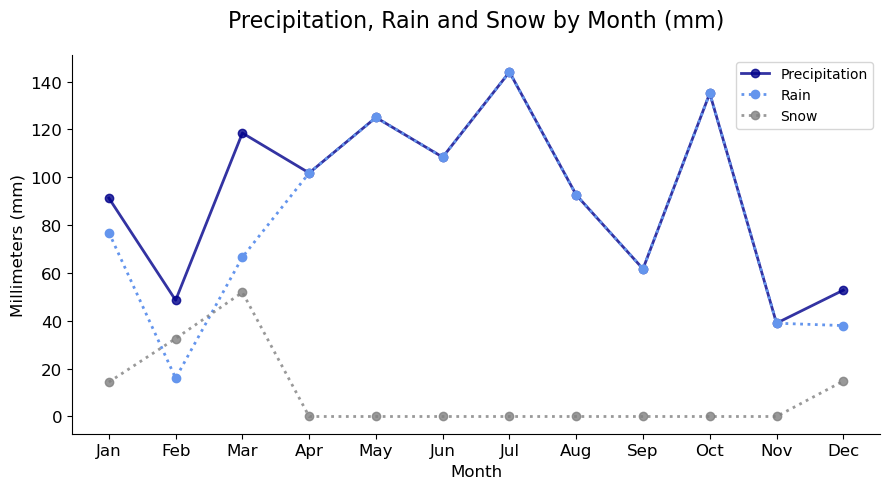

In [ ]:
# Create a copy of the dataframe for precipitation analysis
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)]
# df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
df_prec = df_new.copy()

# Extract date components
df_prec['Date'] = df_prec['CRASH DATE'].dt.date  # Extract just the date part without time
df_prec['Month'] = df_prec['CRASH DATE'].dt.month

# First, get unique precipitation values per day
# Group by date and take the first precipitation value (since all accidents on same day have same value)
daily_prec = df_prec.groupby('Date')['precipitation (mm)'].first().reset_index()
daily_rain = df_prec.groupby('Date')['rain (mm)'].first().reset_index()

# Now group these unique daily values by month and sum
monthly_prec = daily_prec.groupby(daily_prec['Date'].apply(lambda x: x.month))['precipitation (mm)'].sum().reset_index()
monthly_prec.rename(columns={'Date': 'Month'}, inplace=True)

monthly_rain = daily_rain.groupby(daily_rain['Date'].apply(lambda x: x.month))['rain (mm)'].sum().reset_index()
monthly_rain.rename(columns={'Date': 'Month'}, inplace=True)

# Create a more readable month name column
import calendar
monthly_prec['Month_Name'] = monthly_prec['Month'].apply(lambda x: calendar.month_abbr[x])
monthly_rain['Month_Name'] = monthly_rain['Month'].apply(lambda x: calendar.month_abbr[x])

# Sort by month number to ensure chronological order
monthly_prec = monthly_prec.sort_values('Month')
monthly_rain = monthly_rain.sort_values('Month')

# Calculate snow as the difference between precipitation and rain
# First, merge the dataframes on Month
monthly_data = pd.merge(monthly_prec, monthly_rain, on=['Month', 'Month_Name'], suffixes=('_prec', '_rain'))
# Then calculate snow
monthly_data['snow (mm)'] = monthly_data['precipitation (mm)'] - monthly_data['rain (mm)']
# Replace negative values with 0 (in case of measurement errors)
monthly_data['snow (mm)'] = monthly_data['snow (mm)'].clip(lower=0)

# Create a single figure
# plt.figure(figsize=(12, 6))

# # Plot all three curves on the same figure
# plt.plot(monthly_data['Month_Name'], monthly_data['precipitation (mm)'], 
#          marker='o', linestyle='-', linewidth=2, color='darkblue', alpha=0.8, label='Precipitation')
# plt.plot(monthly_data['Month_Name'], monthly_data['rain (mm)'], 
#          marker='o', linestyle='-', linewidth=2, color='skyblue', alpha=0.8, label='Rain')
# plt.plot(monthly_data['Month_Name'], monthly_data['snow (mm)'], 
#          marker='o', linestyle='-', linewidth=2, color='lightgray', alpha=0.8, label='Snow')

# # Add labels and title
# plt.xlabel('Month', fontsize=12)
# plt.title('Precipitation, Rain and Snow by Month (mm)', fontsize=16, pad=20)
# plt.grid(axis='y', linestyle='--', alpha=0.0)
# plt.yticks([])
# plt.legend()

# # Disable spines
# ax = plt.gca()  # Get current axes
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(True)

# # Add data points values for precipitation
# for i, prec in enumerate(monthly_data['precipitation (mm)']):
#     plt.annotate(f'{prec:.1f}mm', 
#                  (monthly_data['Month_Name'].iloc[i], prec),
#                  textcoords="offset points", 
#                  xytext=(0,10), 
#                  ha='center',
#                  fontsize=10,
#                  color='darkblue')

# # Add data points values for rain
# for i, rain in enumerate(monthly_data['rain (mm)']):
#     plt.annotate(f'{rain:.1f}mm', 
#                  (monthly_data['Month_Name'].iloc[i], rain),
#                  textcoords="offset points", 
#                  xytext=(0,10), 
#                  ha='center',
#                  fontsize=10,
#                  color='skyblue')

# # Add data points values for snow
# for i, snow in enumerate(monthly_data['snow (mm)']):
#     plt.annotate(f'{snow:.1f}mm', 
#                  (monthly_data['Month_Name'].iloc[i], snow),
#                  textcoords="offset points", 
#                  xytext=(0,10), 
#                  ha='center',
#                  fontsize=10,
#                  color='gray')

# plt.tight_layout()
# plt.show()

plt.figure(figsize=(9, 5))

# Plot all three curves on the same figure
plt.plot(monthly_data['Month_Name'], monthly_data['precipitation (mm)'], 
         marker='o', linestyle='-', linewidth=2, color='darkblue', alpha=0.8, label='Precipitation')
plt.plot(monthly_data['Month_Name'], monthly_data['rain (mm)'], 
         marker='o', linestyle='dotted', linewidth=2, color='cornflowerblue', alpha=1, label='Rain')
plt.plot(monthly_data['Month_Name'], monthly_data['snow (mm)'], 
         marker='o', linestyle='dotted', linewidth=2, color='gray', alpha=0.8, label='Snow')

# Add labels and title
plt.xlabel('Month', fontsize=12)
plt.ylabel('Millimeters (mm)', fontsize=12)  # Add y-axis label
plt.title('Precipitation, Rain and Snow by Month (mm)', fontsize=16, pad=20)
plt.grid(axis='y', linestyle='--', alpha=0.0)  # Make grid visible since we're showing y-axis

# Show y-ticks
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12) 

# Disable spines
ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)  # Make left spine visible for y-axis
ax.spines['bottom'].set_visible(True)

# Remove the annotation code blocks since we don't want text over the points
# (Removing the three annotation blocks that were here)

plt.legend()
plt.tight_layout()
plt.show()

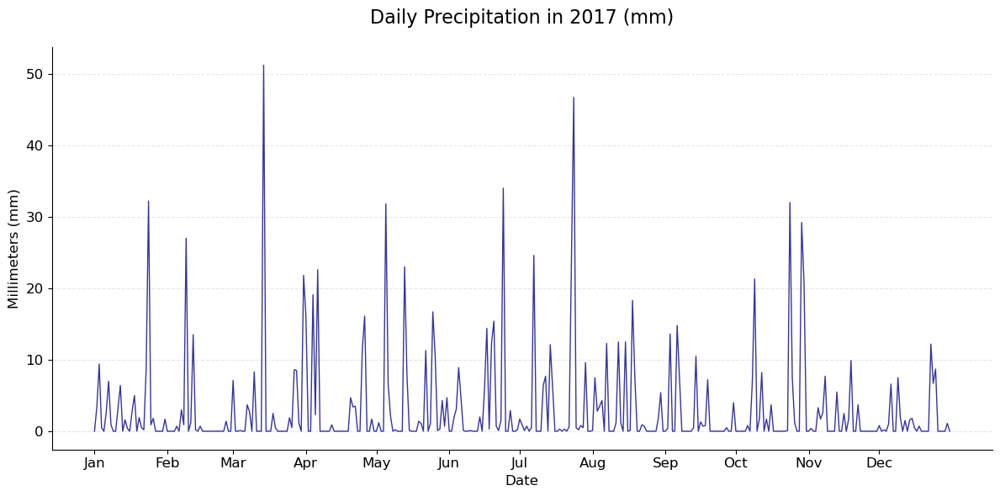

In [82]:
# Create a copy of the dataframe for precipitation analysis
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)]
# df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
df_prec = df_new.copy()

# Extract date components
df_prec['Date'] = df_prec['CRASH DATE'].dt.date  # Extract just the date part without time

# Get unique precipitation values per day
daily_prec = df_prec.groupby('Date')['precipitation (mm)'].first().reset_index()

# Sort by date
daily_prec = daily_prec.sort_values('Date')

# Create a figure
plt.figure(figsize=(12, 6))

# Plot precipitation curve
plt.plot(daily_prec['Date'], daily_prec['precipitation (mm)'], linestyle='-', linewidth=1, color='darkblue', alpha=0.8)

# Add labels and title
plt.xlabel('Date', fontsize=12)
plt.ylabel('Millimeters (mm)', fontsize=12)
plt.title('Daily Precipitation in 2017 (mm)', fontsize=16, pad=20)
plt.grid(axis='y', linestyle='--', alpha=0.3)  # Light grid lines for y-axis

# Create a list of the first day of each month in 2017
import datetime
first_days = [datetime.date(2017, month, 1) for month in range(1, 13)]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set the x-ticks to show only the first day of each month
plt.xticks(first_days, month_labels, fontsize=12)
plt.yticks(fontsize=12)

# Disable spines
ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()

## **Avergage Cloudcover**

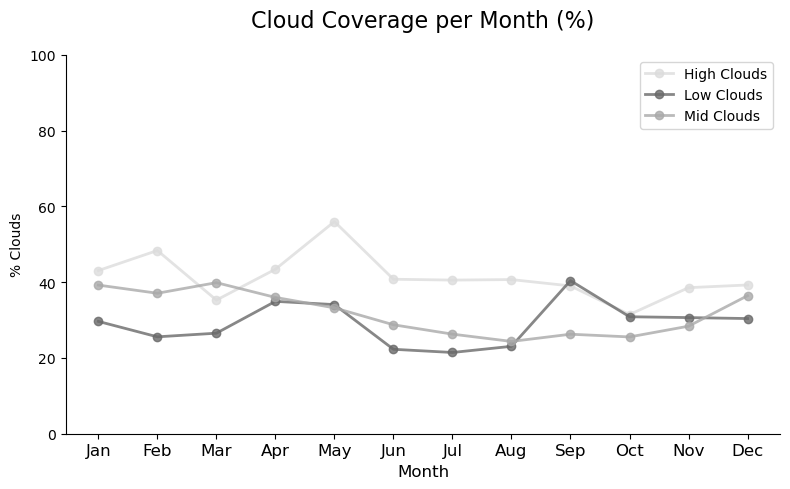

In [83]:
# Create a copy of the dataframe for temperature analysis
df_new = df.copy()
df_new = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)]
df_clouds = df_new.copy()

# Extract month from CRASH DATE
df_clouds['Month'] = df_clouds['CRASH DATE'].dt.month

# Group by month and calculate average temperature and std
monthly_stats_high = df_clouds.groupby('Month')['cloudcover_high (%)'].agg(['mean', 'std']).reset_index()
monthly_stats_low = df_clouds.groupby('Month')['cloudcover_low (%)'].agg(['mean', 'std']).reset_index()
monthly_stats_mid = df_clouds.groupby('Month')['cloudcover_mid (%)'].agg(['mean', 'std']).reset_index()

# Create a more readable month name column
import calendar
monthly_stats_high['Month_Name'] = monthly_stats_high['Month'].apply(lambda x: calendar.month_abbr[x])
monthly_stats_low['Month_Name'] = monthly_stats_low['Month'].apply(lambda x: calendar.month_abbr[x])
monthly_stats_mid['Month_Name'] = monthly_stats_mid['Month'].apply(lambda x: calendar.month_abbr[x])

# Sort by month number to ensure chronological order
monthly_stats_high = monthly_stats_high.sort_values('Month')
monthly_stats_low = monthly_stats_low.sort_values('Month')
monthly_stats_mid = monthly_stats_mid.sort_values('Month')

plt.figure(figsize=(8, 5))

# # Plot the standard deviation region
# plt.fill_between(monthly_stats['Month_Name'], 
#                  monthly_stats['mean'] - monthly_stats['std'],
#                  monthly_stats['mean'] + monthly_stats['std'],
#                  alpha=0.2, color='darkblue', label='±1 std')

# Plot the mean line
plt.plot(monthly_stats_high['Month_Name'], monthly_stats_high['mean'], 
         marker='o', linestyle='-', linewidth=2, color='gainsboro', alpha=0.8, label='High Clouds')
        
plt.plot(monthly_stats_low['Month_Name'], monthly_stats_low['mean'], 
         marker='o', linestyle='-', linewidth=2, color='dimgray', alpha=0.8, label='Low Clouds')

plt.plot(monthly_stats_mid['Month_Name'], monthly_stats_mid['mean'], 
         marker='o', linestyle='-', linewidth=2, color='darkgrey', alpha=0.8, label='Mid Clouds')

# Add labels and title
plt.xlabel('Month', fontsize=12)
plt.ylim([0,100])
plt.ylabel('% Clouds')
plt.title('Cloud Coverage per Month (%)', fontsize=16, pad=20)

# Customize the plot
plt.grid(axis='y', linestyle='--', alpha=0.0)
plt.xticks(fontsize=12)
# plt.yticks([])

# Disable spines
ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# Add data points values
# for i, row in monthly_stats.iterrows():
#     plt.annotate(f'{row["mean"]:.1f}%', 
#                  (row['Month_Name'], row['mean']),
#                  textcoords="offset points", 
#                  xytext=(0,10), 
#                  ha='center',
#                  fontsize=11)

plt.legend()
plt.tight_layout()
plt.show()

# **ACCIDENTS and WEATHER**

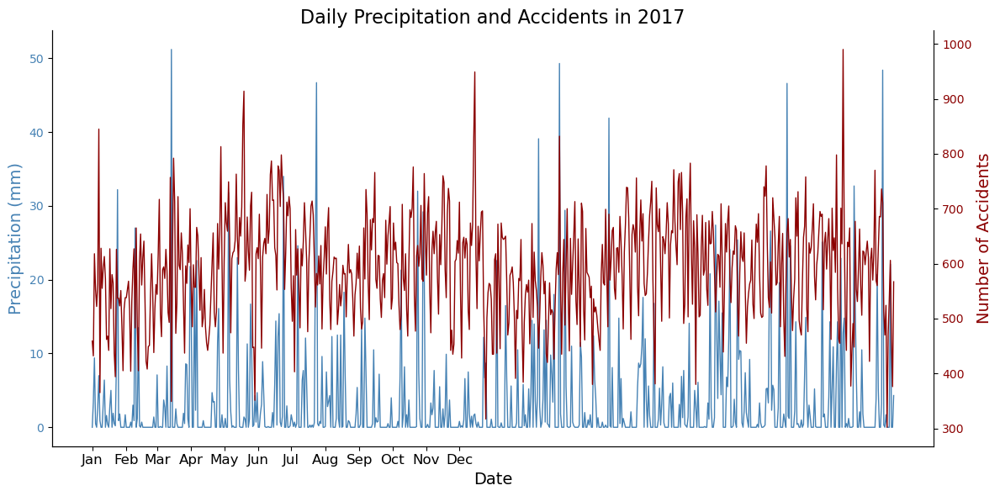

In [84]:
# Filter for 2017 and extract date
df_2017 = df_new[(df_new['CRASH DATE'].dt.year==2017)|(df_new['CRASH DATE'].dt.year==2018)].copy()
df_2017['Date'] = df_2017['CRASH DATE'].dt.date

# Get daily precipitation (first recorded value per day)
daily_prec = df_2017.groupby('Date')['precipitation (mm)'].first().reset_index()
daily_prec['Date'] = pd.to_datetime(daily_prec['Date'])

# Count number of accidents per day
accidents_per_day = df_2017.groupby('Date').size().reset_index(name='Accident Count')
accidents_per_day['Date'] = pd.to_datetime(accidents_per_day['Date'])

# Merge the two datasets on Date
merged_daily = pd.merge(daily_prec, accidents_per_day, on='Date', how='inner')

# Plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Precipitation (left y-axis)
ax1.plot(merged_daily['Date'], merged_daily['precipitation (mm)'], color='steelblue', label='Precipitation (mm)', linewidth=1)
ax1.set_xlabel('Date', fontsize=14)
ax1.set_ylabel('Precipitation (mm)', color='steelblue', fontsize=14)
ax1.tick_params(axis='y', labelcolor='steelblue')

# Custom x-ticks for first day of each month
first_days = [datetime.date(2017, month, 1) for month in range(1, 13)]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax1.set_xticks(first_days)
ax1.set_xticklabels(month_labels, fontsize=12)
ax1.tick_params(axis='x', labelsize=12)

# Accidents (right y-axis)
ax2 = ax1.twinx()
ax2.plot(merged_daily['Date'], merged_daily['Accident Count'], color='darkred', label='Accidents', linewidth=1)
ax2.set_ylabel('Number of Accidents', color='darkred', fontsize=14)
ax2.tick_params(axis='y', labelcolor='darkred')

# Aesthetic adjustments
for spine in ['top', 'right']:
    ax1.spines[spine].set_visible(False)
ax2.spines['top'].set_visible(False)

plt.title('Daily Precipitation and Accidents in 2017', fontsize=16)
plt.tight_layout()
plt.show()

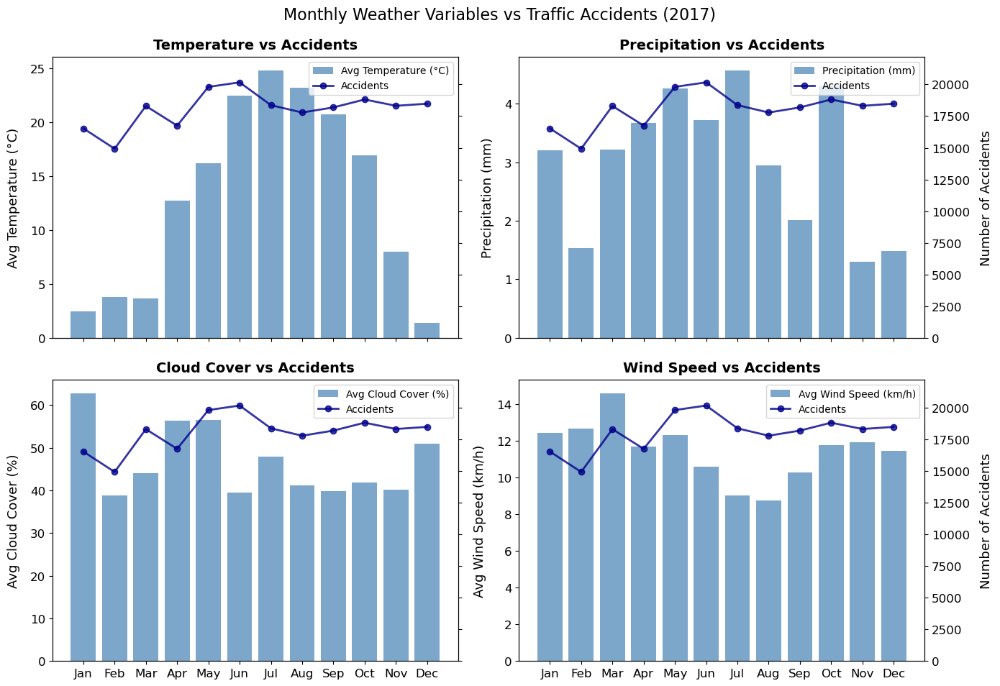

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import calendar

# Data
df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)].copy()
# df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)|(df['CRASH DATE'].dt.year == 2018)].copy()
df_2017['Month'] = df_2017['CRASH DATE'].dt.month
# df_2017['Date'] = df_2017['CRASH DATE'].dt.date

acc_pm   = df_2017.groupby('Month').size()
temp_pm  = df_2017.groupby('Month')['temperature_2m (°C)'].mean()
prec_pm  = df_2017.groupby('Month')['precipitation (mm)'].mean()
# prec_pm = prec_pm.groupby(prec_pm['Date'].apply(lambda x: x.month))['precipitation (mm)'].sum().reset_index()
# prec_pm.rename(columns={'Date': 'Month'}, inplace=True)
cloud_pm = df_2017.groupby('Month')['cloudcover (%)'].mean()
wind_pm  = df_2017.groupby('Month')['windspeed_10m (km/h)'].mean()

panels = [
    {"series": temp_pm,  "label": "Avg Temperature (°C)",  "title": "Temperature vs Accidents"},
    {"series": prec_pm,  "label": "Precipitation (mm)", "title": "Precipitation vs Accidents"},
    {"series": cloud_pm, "label": "Avg Cloud Cover (%)",   "title": "Cloud Cover vs Accidents"},
    {"series": wind_pm,  "label": "Avg Wind Speed (km/h)", "title": "Wind Speed vs Accidents"},
]

month_names = [calendar.month_abbr[m] for m in range(1, 13)]
acc_ymax = acc_pm.max() * 1.1

# Plot
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

bar_kw  = dict(color="steelblue", alpha=0.7)
line_kw = dict(color="darkblue", marker="o", linewidth=2, alpha=0.8)

for i, (ax, p) in enumerate(zip(axes, panels)):
    # left axis: weather bars
    ax.bar(month_names, p["series"].reindex(range(1, 13)).values, **bar_kw, label=p["label"])
    ax.set_ylabel(p["label"], fontsize=13, labelpad=10)
    ax.tick_params(axis="x", rotation=0, labelsize=12)
    ax.tick_params(axis="x", labelsize=12)
    ax.tick_params(axis="y", labelsize=12)

    # right axis: accident line
    twin = ax.twinx()
    twin.plot(month_names, acc_pm.reindex(range(1, 13)).values, **line_kw, label="Accidents")
    twin.set_ylabel("Number of Accidents", fontsize=13, labelpad=10)
    twin.set_ylim(0, acc_ymax)
    twin.tick_params(axis="y", labelsize=12)

    # hide and keep axes according to position
    # hide right-y on left column
    if i in (0, 2):
        twin.set_ylabel("")
        twin.set_yticklabels([])
        # twin.tick_params(axis="y", length=0)   # remove tick lines

    # hide x on top row
    if i in (0, 1):
        ax.set_xlabel("")
        ax.set_xticklabels([])
        # ax.tick_params(axis="x", length=0)

    # titles, spines, legend
    ax.set_title(p["title"],
             fontsize=14,
             fontweight="bold",
             pad=8)
    # for s in ["top"]:
    #     ax.spines[s].set_visible(False)
    #     twin.spines[s].set_visible(False)

    h1, l1 = ax.get_legend_handles_labels()
    h2, l2 = twin.get_legend_handles_labels()
    ax.legend(h1 + h2, l1 + l2, loc="upper right", fontsize=10)

fig.suptitle("Monthly Weather Variables vs Traffic Accidents (2017)", fontsize=16, y=0.95)
plt.tight_layout()
plt.subplots_adjust(top=0.88, wspace=0.15, hspace=0.15)
plt.show()



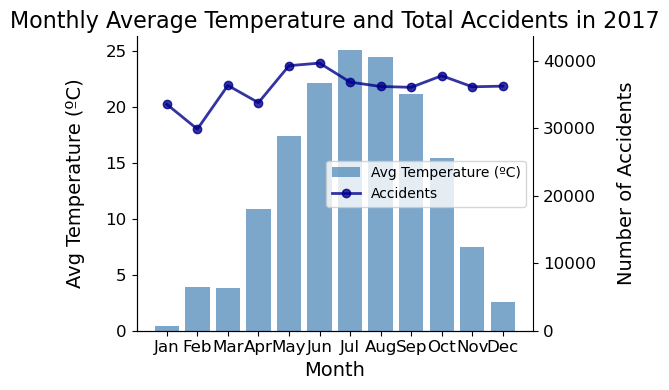

In [ ]:
# TEMPERATURE
# Filter for 2017
df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)|(df['CRASH DATE'].dt.year == 2018)].copy()

# Extract month for grouping
df_2017['Month'] = df_2017['CRASH DATE'].dt.month

# Group by month to get accident count
accidents_per_month = df_2017.groupby('Month').size().reset_index(name='Accident Count')

# Calculate average monthly precipitation
monthly_temp = df_2017.groupby('Month')['temperature_2m (°C)'].mean().reset_index()
monthly_temp.rename(columns={'temperature_2m (°C)': 'Avg Temperature (ºC)'}, inplace=True)

# Merge the two datasets on Month
merged_monthly = pd.merge(monthly_temp, accidents_per_month, on='Month', how='inner')

# Create month names for better x-axis labels
month_names = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
    7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
merged_monthly['Month Name'] = merged_monthly['Month'].map(month_names)

# Set up the plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(6, 4))

# Precipitation (left y-axis)
ax1.bar(merged_monthly['Month Name'], merged_monthly['Avg Temperature (ºC)'], 
        color='steelblue', alpha=0.7, label='Avg Temperature (ºC)')
ax1.set_xlabel('Month', fontsize=14)
ax1.set_ylabel('Avg Temperature (ºC)', fontsize=14, labelpad=15)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='x', labelsize=12)

# Accidents (right y-axis)
ax2 = ax1.twinx()
ax2.plot(merged_monthly['Month Name'], merged_monthly['Accident Count'], 
         color='darkblue', marker='o', linewidth=2, alpha=.8, label='Accidents')
ax2.set_ylim(0, merged_monthly['Accident Count'].max() * 1.1)  # Adjust the upper limit
ax2.set_ylabel('Number of Accidents', fontsize=14, labelpad=15)
ax2.tick_params(axis='y', labelsize=12)
ax2

# Aesthetic adjustments
for spine in ['top', 'right']:
    ax1.spines[spine].set_visible(False)
ax2.spines['top'].set_visible(False)

# Title and layout
plt.title('Monthly Average Temperature and Total Accidents in 2017', fontsize=16)
plt.tight_layout()

# Add a legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.show()

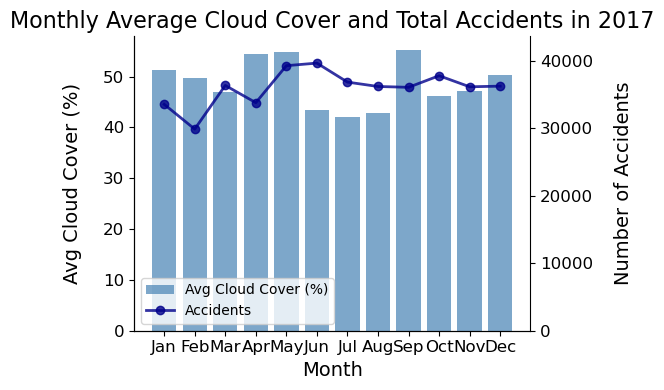

In [ ]:
# CLOUD COVER
# Filter for 2017
df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)|(df['CRASH DATE'].dt.year == 2018)].copy()

# Extract month for grouping
df_2017['Month'] = df_2017['CRASH DATE'].dt.month

# Group by month to get accident count
accidents_per_month = df_2017.groupby('Month').size().reset_index(name='Accident Count')

# Calculate average monthly precipitation
monthly_temp = df_2017.groupby('Month')['cloudcover (%)'].mean().reset_index()
monthly_temp.rename(columns={'cloudcover (%)': 'Avg Temperature (ºC)'}, inplace=True)

# Merge the two datasets on Month
merged_monthly = pd.merge(monthly_temp, accidents_per_month, on='Month', how='inner')

# Create month names for better x-axis labels
month_names = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
    7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
merged_monthly['Month Name'] = merged_monthly['Month'].map(month_names)

# Set up the plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(6, 4))

# Precipitation (left y-axis)
ax1.bar(merged_monthly['Month Name'], merged_monthly['Avg Temperature (ºC)'], 
        color='steelblue', alpha=0.7, label='Avg Cloud Cover (%)')
ax1.set_xlabel('Month', fontsize=14)
ax1.set_ylabel('Avg Cloud Cover (%)', fontsize=14, labelpad=15)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='x', labelsize=12)

# Accidents (right y-axis)
ax2 = ax1.twinx()
ax2.plot(merged_monthly['Month Name'], merged_monthly['Accident Count'], 
         color='darkblue', marker='o', linewidth=2, alpha=.8, label='Accidents')
ax2.set_ylim(0, merged_monthly['Accident Count'].max() * 1.1)  # Adjust the upper limit
ax2.set_ylabel('Number of Accidents', fontsize=14, labelpad=15)
ax2.tick_params(axis='y', labelsize=12)
ax2

# Aesthetic adjustments
for spine in ['top', 'right']:
    ax1.spines[spine].set_visible(False)
ax2.spines['top'].set_visible(False)

# Title and layout
plt.title('Monthly Average Cloud Cover and Total Accidents in 2017', fontsize=16)
plt.tight_layout()

# Add a legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

plt.show()

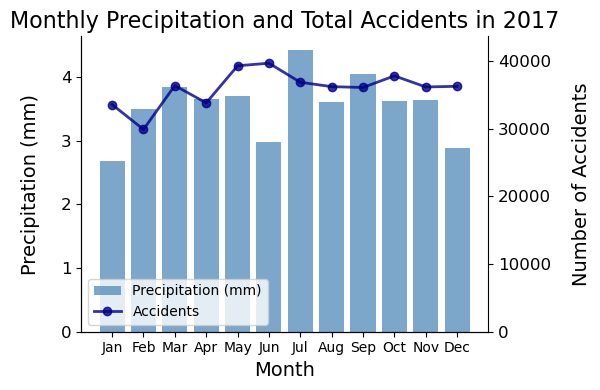

In [ ]:
# Filter for 2017 and extract date
df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)|(df['CRASH DATE'].dt.year == 2018)].copy()
df_2017['Month'] = df_2017['CRASH DATE'].dt.month

# Get monthly precipitation (average per month)
monthly_prec = df_2017.groupby('Month')['precipitation (mm)'].mean().reset_index()

# Count number of accidents per month
accidents_per_month = df_2017.groupby('Month').size().reset_index(name='Accident Count')

# Merge the two datasets on Month
merged_monthly = pd.merge(monthly_prec, accidents_per_month, on='Month', how='inner')

# Add month names for better readability
import calendar
merged_monthly['Month_Name'] = merged_monthly['Month'].apply(lambda x: calendar.month_abbr[x])

# Sort by month to ensure chronological order
merged_monthly = merged_monthly.sort_values('Month')

# Plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(6, 4))

# Precipitation as bar plot (left y-axis)
ax1.bar(merged_monthly['Month_Name'], merged_monthly['precipitation (mm)'],
        color='steelblue', alpha=0.7, label='Precipitation (mm)')
ax1.set_xlabel('Month', fontsize=14)
ax1.set_ylabel('Precipitation (mm)', fontsize=14, labelpad=15)
ax2.set_ylim(0, merged_monthly['precipitation (mm)'].max() * 1.1)
ax1.tick_params(axis='y', labelsize=12)

# Accidents as line plot (right y-axis)
ax2 = ax1.twinx()
ax2.plot(merged_monthly['Month_Name'], merged_monthly['Accident Count'],
         marker='o', linestyle='-', linewidth=2, color='darkblue', alpha=.8, label='Accidents')
ax2.set_ylabel('Number of Accidents', fontsize=14, labelpad=15)
ax2.set_ylim(0, merged_monthly['Accident Count'].max() * 1.1)  # Adjust the upper limit
ax2.tick_params(axis='y', labelsize=12)

# Aesthetic adjustments
for spine in ['top', 'right']:
    ax1.spines[spine].set_visible(False)
ax2.spines['top'].set_visible(False)

# Create a combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

plt.title('Monthly Precipitation and Total Accidents in 2017', fontsize=16)
plt.tight_layout()
plt.show()

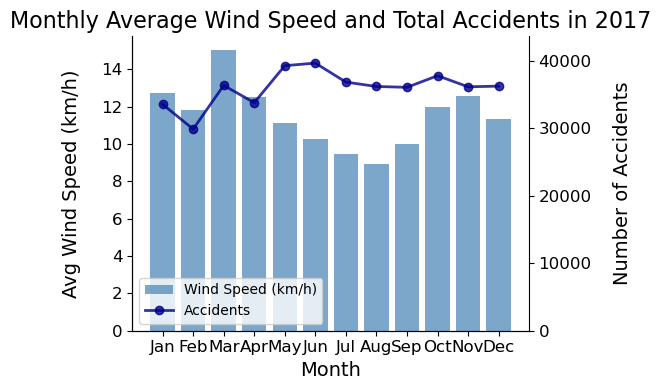

In [ ]:
# WIND SPEED
# Filter for 2017
df_2017 = df.loc[(df['CRASH DATE'].dt.year == 2017)|(df['CRASH DATE'].dt.year == 2018)].copy()

# Extract month for grouping
df_2017['Month'] = df_2017['CRASH DATE'].dt.month

# Group by month to get accident count
accidents_per_month = df_2017.groupby('Month').size().reset_index(name='Accident Count')

# Calculate average monthly precipitation
monthly_temp = df_2017.groupby('Month')['windspeed_10m (km/h)'].mean().reset_index()
monthly_temp.rename(columns={'windspeed_10m (km/h)': 'Avg Temperature (ºC)'}, inplace=True)

# Merge the two datasets on Month
merged_monthly = pd.merge(monthly_temp, accidents_per_month, on='Month', how='inner')

# Create month names for better x-axis labels
month_names = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
    7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
merged_monthly['Month Name'] = merged_monthly['Month'].map(month_names)

# Set up the plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(6, 4))

# Precipitation (left y-axis)
ax1.bar(merged_monthly['Month Name'], merged_monthly['Avg Temperature (ºC)'], 
        color='steelblue', alpha=0.7, label='Wind Speed (km/h)')
ax1.set_xlabel('Month', fontsize=14)
ax1.set_ylabel('Avg Wind Speed (km/h)', fontsize=14, labelpad=15)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='x', labelsize=12)

# Accidents (right y-axis)
ax2 = ax1.twinx()
ax2.plot(merged_monthly['Month Name'], merged_monthly['Accident Count'], 
         color='darkblue', marker='o', linewidth=2, alpha=.8, label='Accidents')
ax2.set_ylim(0, merged_monthly['Accident Count'].max() * 1.1)  # Adjust the upper limit
ax2.set_ylabel('Number of Accidents', fontsize=14, labelpad=15)
ax2.tick_params(axis='y', labelsize=12)
ax2

# Aesthetic adjustments
for spine in ['top', 'right']:
    ax1.spines[spine].set_visible(False)
ax2.spines['top'].set_visible(False)

# Title and layout
plt.title('Monthly Average Wind Speed and Total Accidents in 2017', fontsize=16)
plt.tight_layout()

# Add a legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

plt.show()